# Problem Definition

The datathon results should contain predictions for each ATM for each day and should be provided in csv format consisting of three columns:

* CASHPOINTID - unique identifier of ATM for which the prediction is made;
* OPERATIONDATE - date (must be in [2020-01-01 - 2020-01-31] period) for which the prediction is made;
* AMT_SCALED - predicted total daily withdrawal amount (scaled)

Participants will be asked for the repository in which they built the forecasting model.

After submitting the results, participants are expected to explain their approach, extracted insights and model.



Work done will be evaluated according to the following criteria:

* OOS (Out of Sample) error metrics;
* Ability to communicate the results;
* Code quality and implementability.


# Imports

In [1]:
import pandas as pd
import os
import sys
import matplotlib.pyplot as plt
import numpy as np

In [2]:
os.chdir('../')

# Read Data

* CASHPOINTID - unique identifier of ATM for which the prediction is made;
* OPERATIONDATE - date (must be in [2020-01-01 - 2020-01-31] period) for which the prediction is made;
* AMT_SCALED - predicted total daily withdrawal amount (scaled)

In [3]:
df = pd.read_csv('data/train_aggregated_by_day.csv')
df.date = pd.to_datetime(df.date)
df.set_index('date', inplace=True)

In [4]:
df.head()

,id,amt
date,,
2017-01-01,0,0.027997
2017-01-02,0,0.040519
2017-01-03,0,0.136281
2017-01-04,0,0.000074
2017-01-05,0,0.075411


# Add Some Features

## Generate internal features from date (Day, Week, Month, Year)

In [5]:
_date_features = pd.DataFrame(
    pd.Series(df.index.values).apply(lambda x: (x.day, x.month, x.week, x.weekday(), x.year)).values.tolist(),
    columns=['day', 'month', 'week', 'weekday', 'year'],
    index=df.index
)

In [6]:
_date_features.sample(10)

,day,month,week,weekday,year
date,,,,,
2017-09-08,8,9,36,4,2017
2019-09-13,13,9,37,4,2019
2018-05-10,10,5,19,3,2018
2018-01-17,17,1,3,2,2018
2017-12-25,25,12,52,0,2017
2017-03-29,29,3,13,2,2017
2019-05-25,25,5,21,5,2019
2017-12-11,11,12,50,0,2017
2019-03-03,3,3,9,6,2019


## Generate holiday features

In [7]:
holidays = {
"2017-01-01": "new_year", 
"2018-01-01": "new_year", 
"2019-01-01": "new_year",
"2020-01-01": "new_year",
"2017-01-14": "new_year", 
"2018-01-14": "new_year", 
"2019-01-14": "new_year",
"2020-01-14": "new_year",
"2017-01-07": "christmas", 
"2018-01-07": "christmas", 
"2019-01-07": "christmas",
"2020-01-07": "christmas",
"2017-12-25": "christmas", 
"2018-12-25": "christmas", 
"2019-12-25": "christmas",
"2017-01-19": "epiphany", 
"2018-01-19": "epiphany", 
"2019-01-19": "epiphany", 
"2017-03-03": "mothers_day", 
"2018-03-03": "mothers_day", 
"2019-03-03": "mothers_day", 
"2017-03-08": "women_day", 
"2018-03-08": "women_day", 
"2019-03-08": "women_day", 
"2017-04-16": "easter", 
"2018-04-08": "easter", 
"2019-04-28": "easter", 
"2017-05-26": "independence", 
"2018-05-26": "independence", 
"2019-05-26": "independence", 
"2017-08-28": "assumption", 
"2018-08-28": "assumption", 
"2019-08-28": "assumption", 
"2017-10-14": "orthodox_festival", 
"2018-10-14": "orthodox_festival", 
"2019-10-14": "orthodox_festival", 
"2017-11-23": "george_day", 
"2018-11-23": "george_day", 
"2019-11-23": "george_day"
}

In [8]:
_holiday_features = pd.DataFrame(
    pd.Series(df.index.values).apply(lambda x: 1 if str(x.date()) in holidays else 0).values,
    columns=['holiday'],
    index=df.index
)

In [9]:
_holiday_features.sample(5)

,holiday
date,
2018-08-03,0
2017-05-13,0
2017-04-12,0
2017-12-12,0
2019-02-22,0


## Add All generated features

In [10]:
df = pd.concat([_date_features, _holiday_features, df], axis=1)

In [11]:
df.head()

,day,month,week,weekday,year,holiday,id,amt
date,,,,,,,,
2017-01-01,1,1,52,6,2017,1,0,0.027997
2017-01-02,2,1,1,0,2017,0,0,0.040519
2017-01-03,3,1,1,1,2017,0,0,0.136281
2017-01-04,4,1,1,2,2017,0,0,0.000074
2017-01-05,5,1,1,3,2017,0,0,0.075411


# Data Preprocessing

### generate sliding windows

In [12]:
def get_window(dataframe, size=10, by='id', target='amt'):
    columns = []
    for column in dataframe.columns:
        for idx in range(size):
            columns.append(f'{column}(t-{size-idx})')
        
    records = []
    targets = []
    indices = []
    for grp_id, group in dataframe.groupby('id'):
        print(f'ID:{grp_id}')
        for target_idx in range(0, len(group) - size - 1):
            record = []
            for column_idx, column in enumerate(group.columns):
                for idx in range(size):
                    record.append(group.iloc[target_idx+idx, column_idx])
            
            indices.append(group.index[target_idx+size])
            records.append(record)
            targets.append(group.iloc[target_idx+size, -1])
        
    return pd.DataFrame(records, index=indices, columns=columns), pd.DataFrame(targets)

In [13]:
WINDOW_SIZE = 14

In [14]:
_X, _Y = get_window(df.head(200))

ID:0


In [15]:
_X.head()

,day(t-10),day(t-9),day(t-8),day(t-7),day(t-6),day(t-5),day(t-4),day(t-3),day(t-2),day(t-1),...,amt(t-10),amt(t-9),amt(t-8),amt(t-7),amt(t-6),amt(t-5),amt(t-4),amt(t-3),amt(t-2),amt(t-1)
2017-01-11,1,2,3,4,5,6,7,8,9,10,...,0.027997,0.040519,0.136281,0.000074,0.075411,0.107680,0.042070,0.040568,0.102029,0.137586
2017-01-12,2,3,4,5,6,7,8,9,10,11,...,0.040519,0.136281,0.000074,0.075411,0.107680,0.042070,0.040568,0.102029,0.137586,0.000000
2017-01-13,3,4,5,6,7,8,9,10,11,12,...,0.136281,0.000074,0.075411,0.107680,0.042070,0.040568,0.102029,0.137586,0.000000,0.092179
2017-01-14,4,5,6,7,8,9,10,11,12,13,...,0.000074,0.075411,0.107680,0.042070,0.040568,0.102029,0.137586,0.000000,0.092179,0.108690
2017-01-15,5,6,7,8,9,10,11,12,13,14,...,0.075411,0.107680,0.042070,0.040568,0.102029,0.137586,0.000000,0.092179,0.108690,0.070030


In [16]:
_Y.head()

,0
0,0.000000
1,0.092179
2,0.108690
3,0.070030
4,0.063899


In [17]:
# X, Y = get_window(dataframe=df, size=WINDOW_SIZE, by='id', target='amt')
# Y.index = X.index
# dataset = pd.concat([X, Y], axis=1)

In [18]:
# dataset.to_csv('data/preprocessed_dataset_for_lstm_with_sliding_window_of_14_and_additional_features.csv')

In [19]:
dataset = pd.read_csv(
    'data/preprocessed_dataset_for_lstm_with_sliding_window_of_14_and_additional_features.csv', 
    index_col=0
)
dataset.index = pd.to_datetime(dataset.index)

### train/test split

In [20]:
df.index.min(), df.index.max(), (df.index.max() - df.index.min())/2

(Timestamp('2017-01-01 00:00:00'),
 Timestamp('2019-12-31 00:00:00'),
 Timedelta('547 days 00:00:00'))

it's good to include last year's new year month in test split

In [21]:
dataset[dataset.index < pd.Timestamp('2018-12-31')].shape

(749139, 113)

In [22]:
train_df, test_df = dataset[dataset.index < pd.Timestamp('2018-12-31')], dataset[dataset.index >= pd.Timestamp('2018-12-31')]

# Train Stacked LSTM Model

In [41]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
import keras

In [42]:
def save_model(model, path):
    model.save(path)

In [43]:
def load_model(path):
    return keras.models.load_model(path)

### get features and targets

In [70]:
train_X, train_y = train_df.iloc[:, :-1].values, train_df.iloc[:, -1].values
test_X, test_y = test_df.iloc[:, :-1].values, test_df.iloc[:, -1].values

### reshape input to be 3D [samples, timesteps, features]

In [71]:
train_X = train_X.reshape(train_X.shape[0], 8, train_X.shape[1]//8).transpose(0, 2, 1)
test_X = test_X.reshape(test_X.shape[0], 8, test_X.shape[1]//8).transpose(0, 2, 1)

print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(749139, 14, 8) (749139,) (322790, 14, 8) (322790,)


In [79]:
from tensorflow import device

In [80]:
with device('/gpu:0'):
    model = Sequential()
    model.add(LSTM(64, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(64))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    
    history = model.fit(
    train_X,
    train_y, 
    epochs=100, 
    batch_size=1000, 
    validation_data=(test_X, test_y),
    verbose=1, 
    shuffle=True
)

Train on 749139 samples, validate on 322790 samples
Epoch 1/100
749139/749139 [==============================] - 45s 61us/step - loss: 0.0683 - val_loss: 0.0846
Epoch 2/100
749139/749139 [==============================] - 42s 55us/step - loss: 0.0678 - val_loss: 0.0810
Epoch 3/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0679 - val_loss: 0.0816
Epoch 4/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0678 - val_loss: 0.0769
Epoch 5/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0675 - val_loss: 0.0804
Epoch 6/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0666 - val_loss: 0.0750
Epoch 7/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0665 - val_loss: 0.0818
Epoch 8/100
749139/749139 [==============================] - 42s 56us/step - loss: 0.0666 - val_loss: 0.0613
Epoch 9/100
749139/749139 [==============================] - 41s 55us/step -

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



749139/749139 [==============================] - 42s 56us/step - loss: 0.0430 - val_loss: 0.0421
Epoch 46/100
749139/749139 [==============================] - 42s 56us/step - loss: 0.0429 - val_loss: 0.0423
Epoch 47/100
749139/749139 [==============================] - 42s 56us/step - loss: 0.0431 - val_loss: 0.0430
Epoch 48/100
749139/749139 [==============================] - 42s 56us/step - loss: 0.0430 - val_loss: 0.0424
Epoch 49/100
749139/749139 [==============================] - 42s 56us/step - loss: 0.0430 - val_loss: 0.0444
Epoch 50/100
749139/749139 [==============================] - 42s 56us/step - loss: 0.0428 - val_loss: 0.0423
Epoch 51/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0430 - val_loss: 0.0417
Epoch 52/100
170000/749139 [=====>........................] - ETA: 27s - loss: 0.0427

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



749139/749139 [==============================] - 42s 55us/step - loss: 0.0428 - val_loss: 0.0429
Epoch 62/100
749139/749139 [==============================] - 42s 56us/step - loss: 0.0426 - val_loss: 0.0421
Epoch 63/100
749139/749139 [==============================] - 42s 55us/step - loss: 0.0426 - val_loss: 0.0418
Epoch 64/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0426 - val_loss: 0.0430
Epoch 65/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0425 - val_loss: 0.0434
Epoch 66/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0425 - val_loss: 0.0459
Epoch 67/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0426 - val_loss: 0.0421
Epoch 68/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0425 - val_loss: 0.0433
Epoch 69/100
212000/749139 [=======>......................] - ETA: 25s - loss: 0.0423

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



749139/749139 [==============================] - 42s 57us/step - loss: 0.0423 - val_loss: 0.0447
Epoch 79/100
749139/749139 [==============================] - 43s 57us/step - loss: 0.0422 - val_loss: 0.0435
Epoch 80/100
749139/749139 [==============================] - 42s 57us/step - loss: 0.0423 - val_loss: 0.0428
Epoch 81/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0423 - val_loss: 0.0415
Epoch 82/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0423 - val_loss: 0.0434
Epoch 83/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0422 - val_loss: 0.0419
Epoch 84/100
540000/749139 [====================>.........] - ETA: 10s - loss: 0.0423

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



749139/749139 [==============================] - 41s 55us/step - loss: 0.0421 - val_loss: 0.0470
Epoch 95/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0421 - val_loss: 0.0418
Epoch 96/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0421 - val_loss: 0.0466
Epoch 97/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 98/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0419 - val_loss: 0.0420
Epoch 99/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0421 - val_loss: 0.0418
Epoch 100/100
749139/749139 [==============================] - 41s 55us/step - loss: 0.0420 - val_loss: 0.0423


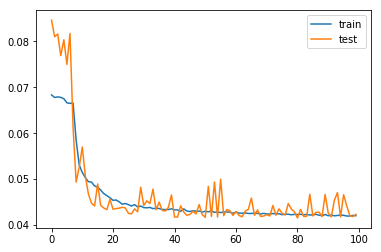

In [81]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [82]:
save_model(model, 'data/stacked_lstm_model_v1')

## Show predictions on test set (whole 2019 year predictions)

In [83]:
test_y_pred = model.predict(test_X)

In [84]:
test_y_pred.shape, test_y.shape

((322790, 1), (322790,))

### do for each ATM

In [99]:
random_ids = df.id.sample(50, random_state=42).tolist()

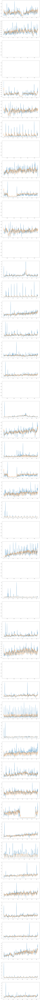

In [100]:
fig, axes = plt.subplots(nrows=len(random_ids), ncols=1, figsize=(15, len(random_ids)*8))
for _id, _ax in zip(random_ids, axes):
    _id_mask = np.apply_along_axis(
            func1d=lambda x: x[-2] == _id, 
            arr=test_X.reshape((test_X.shape[0], -1)), 
            axis=1
        )
    _y = test_y[_id_mask]
    _y_pred = test_y_pred[_id_mask]
    
    _ax.plot(_y)
    _ax.plot(_y_pred)

We see that results are quite promising!

Wow!

# Predict on Test Set

In [131]:
def generate_test_dataset(ids):
    records = []
    for _id in ids:
        for _date in pd.date_range('2020-01-01', '2020-01-31'):
            records.append(
                [
                    _date,
                    _date.day,
                    _date.month,
                    _date.week,
                    _date.weekday(),
                    _date.year,
                    1 if str(_date.date()) in holidays else 0,
                    _id,
                    None
                ]
            )
            
    return pd.DataFrame(
        records, 
        columns=['date', 'day', 'month','week', 'weekday', 'year','holiday','id', 'amt']
    ).set_index('date')

In [120]:
df.head(2)

,day,month,week,weekday,year,holiday,id,amt
date,,,,,,,,
2017-01-01,1,1,52,6,2017,1,0,0.027997
2017-01-02,2,1,1,0,2017,0,0,0.040519


In [121]:
generate_test_dataset(df.id.unique()).head()

,day,month,week,weekday,year,holiday,id,amt
date,,,,,,,,
2020-01-01,1,1,1,2,2020,1,0,None
2020-01-02,2,1,1,3,2020,0,0,None
2020-01-03,3,1,1,4,2020,0,0,None
2020-01-04,4,1,1,5,2020,0,0,None
2020-01-05,5,1,1,6,2020,0,0,None


In [122]:
test_dataset = generate_test_dataset(df.id.unique())

In [123]:
# test_dataset.to_csv('data/test_empty.csv')

We have to generate predictions for given dates

In [124]:
test_dataset_dates = test_dataset.index.unique()

In [125]:
test_dataset_dates

DatetimeIndex(['2020-01-01', '2020-01-02', '2020-01-03', '2020-01-04',
               '2020-01-05', '2020-01-06', '2020-01-07', '2020-01-08',
               '2020-01-09', '2020-01-10', '2020-01-11', '2020-01-12',
               '2020-01-13', '2020-01-14', '2020-01-15', '2020-01-16',
               '2020-01-17', '2020-01-18', '2020-01-19', '2020-01-20',
               '2020-01-21', '2020-01-22', '2020-01-23', '2020-01-24',
               '2020-01-25', '2020-01-26', '2020-01-27', '2020-01-28',
               '2020-01-29', '2020-01-30', '2020-01-31'],
              dtype='datetime64[ns]', name='date', freq=None)

In [129]:
def predict_on_sample(model, sample):
    if sample.shape == (1,14,8):
        return model.predict(sample)[0][0]
    else:
        return model.predict(sample.reshape((1,14,8)))[0][0]

In [130]:
predict_on_sample(model, train_X[1])

0.09489877

window size = 14, so we need to use last 14 records from test dataset split to use them in predictions

In [132]:
def generate_test_data_with_padding(ids):
    records = []
    for _id in ids:
        for _date in pd.date_range('2019-12-18', '2020-01-31'):
            if _date > pd.Timestamp('2019-12-31'):
                records.append(
                    [
                        _date,
                        _date.day,
                        _date.month,
                        _date.week,
                        _date.weekday(),
                        _date.year,
                        1 if str(_date.date()) in holidays else 0,
                        _id,
                        None
                    ]
                )
            else:
                if _id in df.loc[_date].id.values:
                    value = df[df.id==_id].loc[_date, "amt"]
                else:
                    value = None
                
                records.append(
                    [
                        _date,
                        _date.day,
                        _date.month,
                        _date.week,
                        _date.weekday(),
                        _date.year,
                        1 if str(_date.date()) in holidays else 0,
                        _id,
                        value
                    ]
                )
    
    return pd.DataFrame(
        records, 
        columns=['date', 'day', 'month','week', 'weekday', 'year','holiday','id', 'amt']
    ).set_index('date')

In [133]:
test_dataset_padded = generate_test_data_with_padding(df.id.unique())

In [135]:
test_dataset_padded.head(15)

,day,month,week,weekday,year,holiday,id,amt
date,,,,,,,,
2019-12-18,18,12,51,2,2019,0,0,0.115991
2019-12-19,19,12,51,3,2019,0,0,0.119389
2019-12-20,20,12,51,4,2019,0,0,0.144357
2019-12-21,21,12,51,5,2019,0,0,0.163601
2019-12-22,22,12,51,6,2019,0,0,0.069107
2019-12-23,23,12,52,0,2019,0,0,0.117234
2019-12-24,24,12,52,1,2019,0,0,0.113516
2019-12-25,25,12,52,2,2019,1,0,0.143766
2019-12-26,26,12,52,3,2019,0,0,0.168366


Check ATMs that have missing values before 2019 to fill them with 0s in submission file (assuming that they stopped working before 2020)

In [242]:
zero_predictions = test_dataset_padded.groupby('id').apply(lambda x: x.iloc[:14, -1].isna().sum())

In [245]:
(zero_predictions > 0).sum()

441

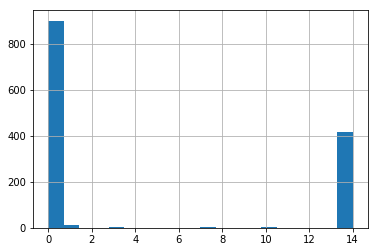

In [248]:
zero_predictions.hist(bins=20);

as we see 441 ATMs have missing values before 2020

it seems that most cases have all 14 days missing.

### make predictions

In [233]:
def plot_predictions_on_test(_id, preds, title):
    _id_mask = np.apply_along_axis(
            func1d=lambda x: x[-2] == _id, 
            arr=test_X.reshape((test_X.shape[0], -1)), 
            axis=1
        )
    _y = test_y[_id_mask]
    _y_pred = test_y_pred[_id_mask]
    _y_all_pred = np.concatenate((_y_pred.reshape(-1), preds), axis=0)

    plt.figure(figsize=(15, 8))
    plt.plot(_y)
    plt.plot(_y_all_pred)
    plt.title(title)
    plt.show()

In [234]:
import random

Plot only 5% of id predictions

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


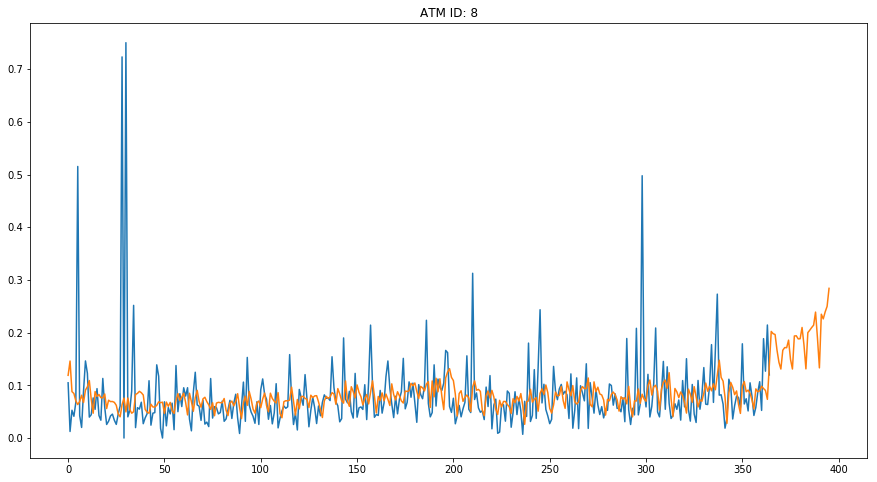

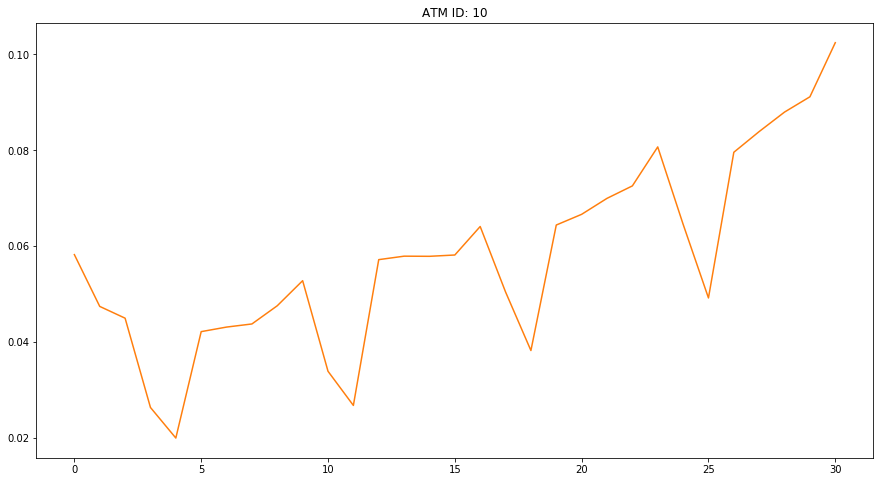

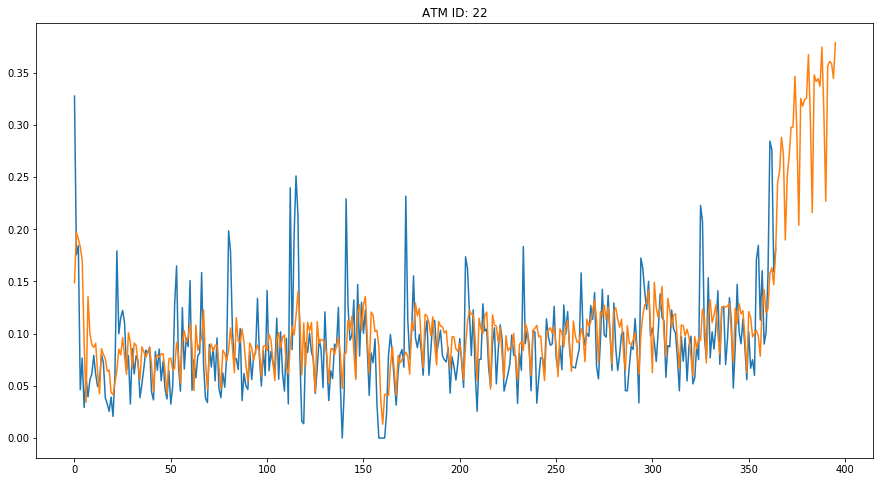

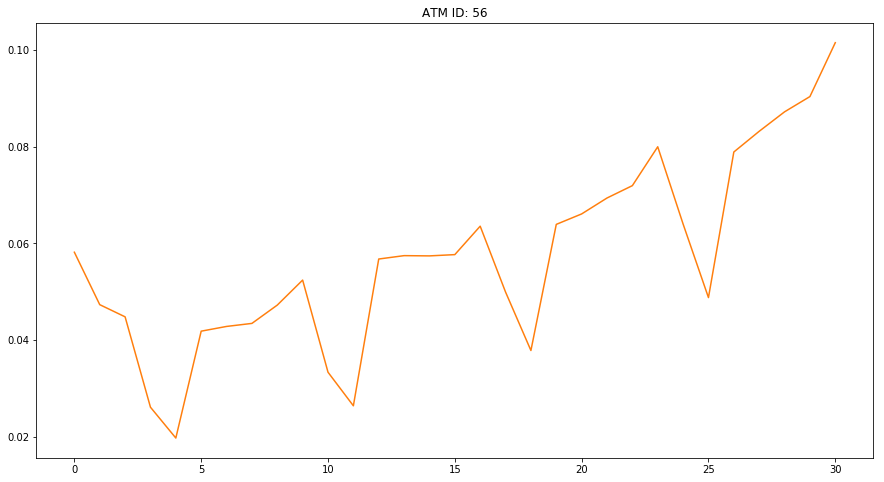

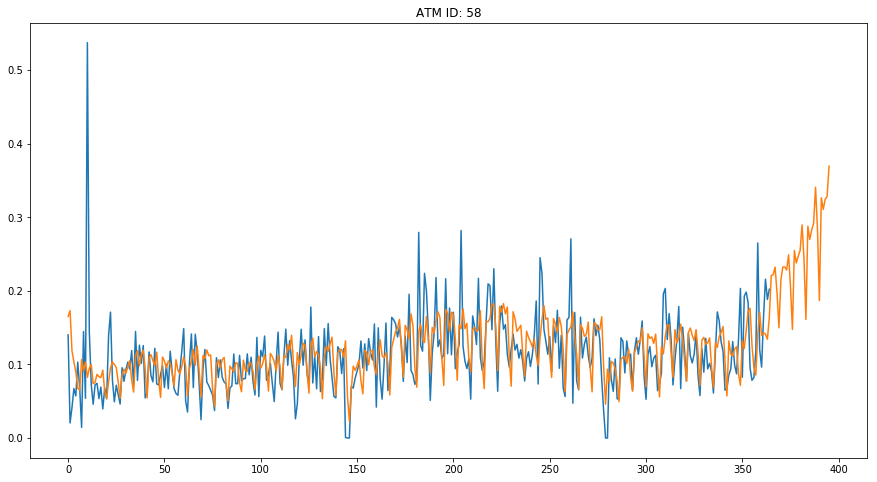

...

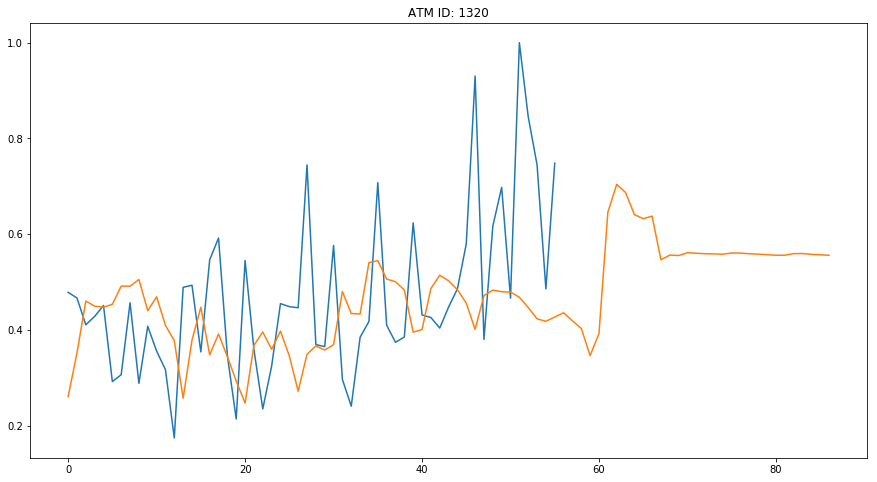

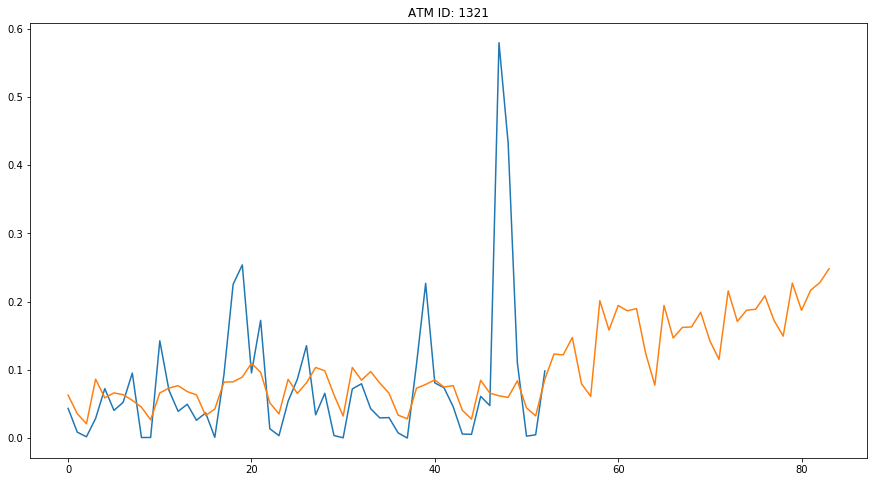

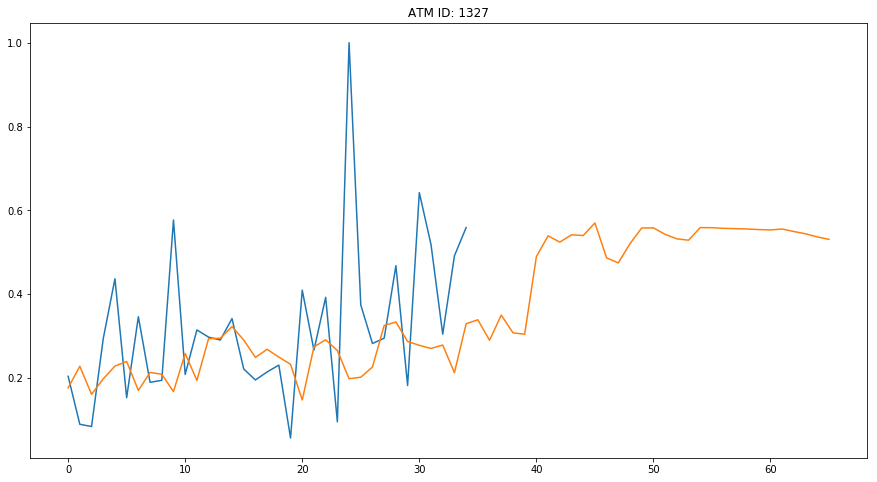

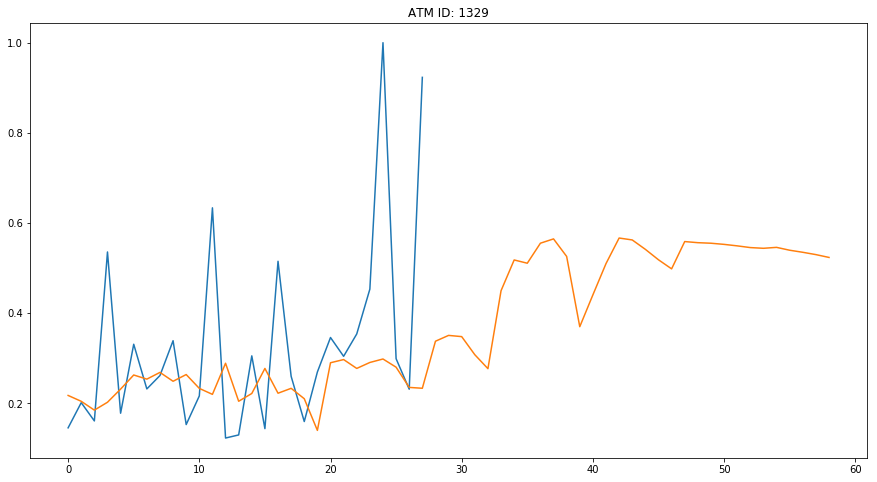

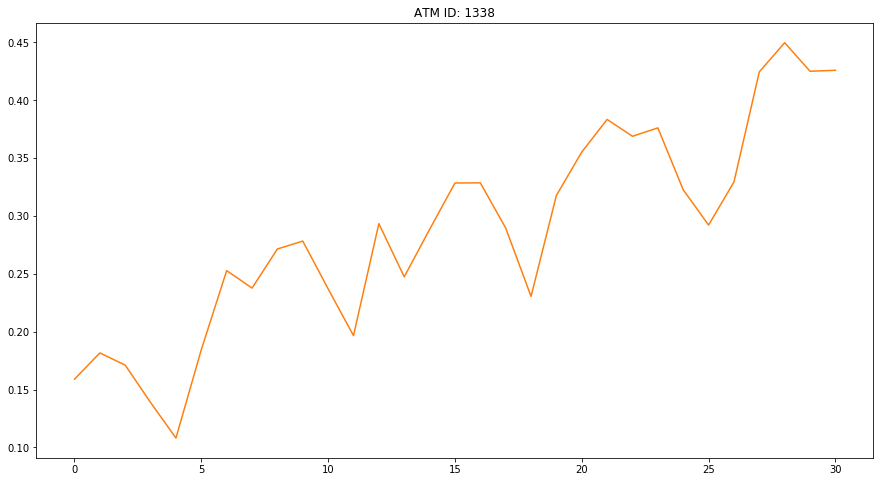

In [236]:
predictions = {}
for _id in df.id.unique():
    _df = test_dataset_padded[test_dataset_padded.id == _id]
    preds_on_id = []
    for st_idx in range(len(_df)-14):        
        sample_input = _df.iloc[st_idx:st_idx+14, :].fillna(0.0).values
        prediction = predict_on_sample(model, sample_input)
        _df.iloc[st_idx+14, -1] = prediction
        preds_on_id.append(prediction)
        
        predictions[(str(_df.index[st_idx+14]), _id)] = prediction
    
    if random.random() < 0.05:
        plot_predictions_on_test(_id=_id, preds=np.array(preds_on_id), title=f"ATM ID: {_id}")

Here we get high errors because of lacking of data. 

We saw that when we had data of previous days, it was performing quite well. Validation set (`test_X`, `test_y`) was generated with window size of 14 and all previous values were right.

If we have truth values for January 2020, our model would still peform well. Unstability is caused by cumulative error.

### Store Predictions

In [237]:
len(predictions) == df.id.unique().shape[0]*31

True

In [276]:
_predictions_df = pd.concat(
    [
        pd.DataFrame(list(predictions.keys()), columns=['OPERATIONDATE', 'CASHPOINTID']), 
        pd.DataFrame(predictions.values(), columns=['AMT_SCALED'])
    ],
    axis=1
)

In [277]:
_predictions_df.OPERATIONDATE = pd.to_datetime(_predictions_df.OPERATIONDATE)

In [278]:
_predictions_df.head()

,OPERATIONDATE,CASHPOINTID,AMT_SCALED
0,2020-01-01,0,0.237125
1,2020-01-02,0,0.243221
2,2020-01-03,0,0.271414
3,2020-01-04,0,0.232770
4,2020-01-05,0,0.157313


In [241]:
_predictions_df.to_csv('data/submisson_stacked_lstm.csv', index=False)

## Replace predictions with zero for ATMs that have last 14 days of 2019 missing

In [279]:
_ids_for_zero_predictions = set(zero_predictions[zero_predictions == 14].index.values)

In [280]:
_predictions_df_with_zeros = _predictions_df.copy(deep=True)

In [281]:
_predictions_df_with_zeros.loc[_predictions_df_with_zeros.CASHPOINTID.apply(lambda x: x in _ids_for_zero_predictions), "AMT_SCALED"] = 0.0

In [282]:
_predictions_df.to_csv('data/submisson_stacked_lstm_with_zero_predictions_on_missing_atms.csv', index=False)

# Apply smoothing by using the previous year values

In [301]:
_previous_january_dates = pd.Series(
    np.concatenate(
        [
            pd.date_range(f'{year}-01-01', f'{year}-01-31').values for year in [2017, 2018, 2019]
        ]
    )
)

In [319]:
_previous_january_amts = df.loc[_previous_january_dates, ['id', 'amt']].set_index('id', append=True)

In [322]:
_previous_january_amts.head(2)

amt
date       id          
2017-01-01 0   0.027997
           1   0.014108

In [359]:
def get_prev_year_amts(dataframe, atm_id, date, years):
    _prev_amts = []
    for year in years:
        _curr_date = date.replace(year=year)
        
        try:
            _curr_amt = dataframe.loc[(_curr_date, atm_id), "amt"]
        except:
            _curr_amt = 0.0
        
        _prev_amts.append(_curr_amt)
    
    return np.array(_prev_amts)

In [362]:
get_prev_year_amts(
    dataframe=_previous_january_amts, 
    atm_id=0, 
    date=pd.Timestamp("2020-01-01"), 
    years=range(2017, 2020)
)

array([0.02799734, 0.03132156, 0.04852134])

In [397]:
def weighted_average(values, weights):
    return (np.array(values)*np.array(weights)).sum()/sum(weights)

In [399]:
weighted_average([0.02799734, 0.03132156, 0.04852134, 0.03], [1,2,3,4])

0.035620448

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


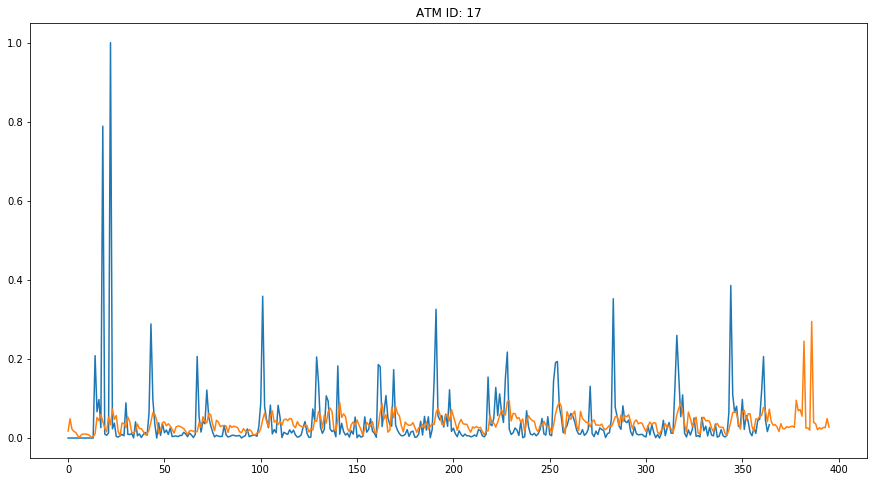

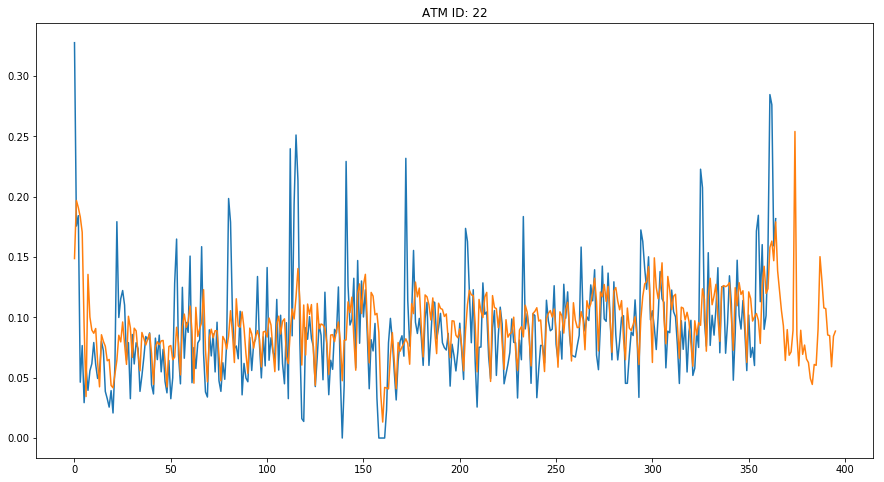

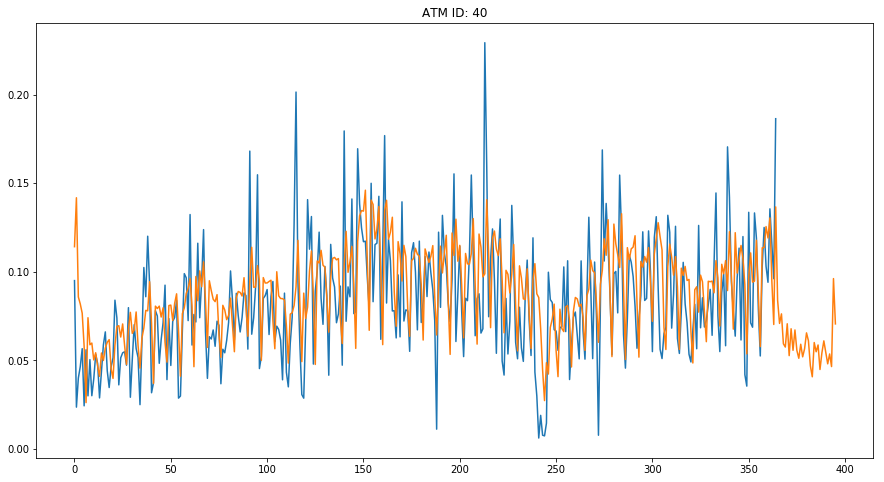

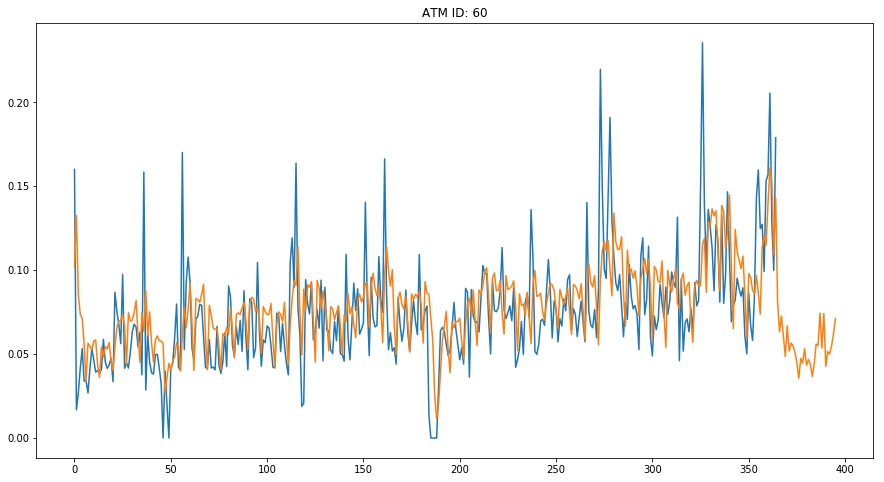

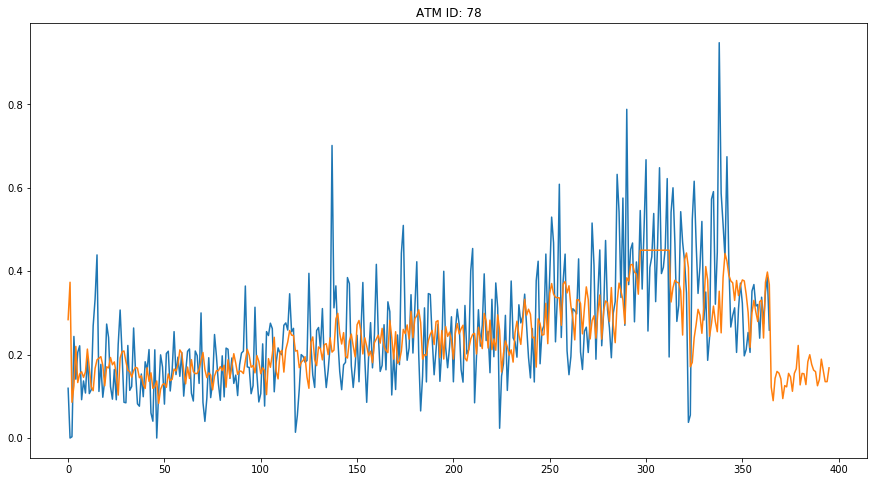

...

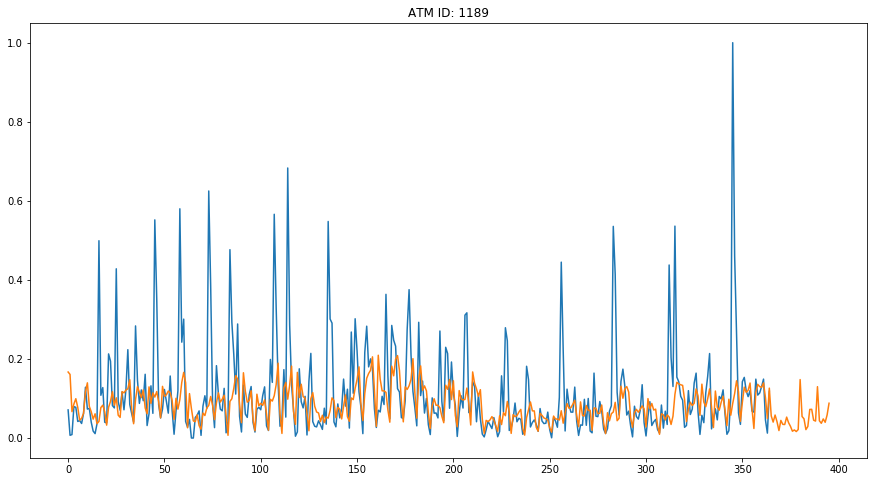

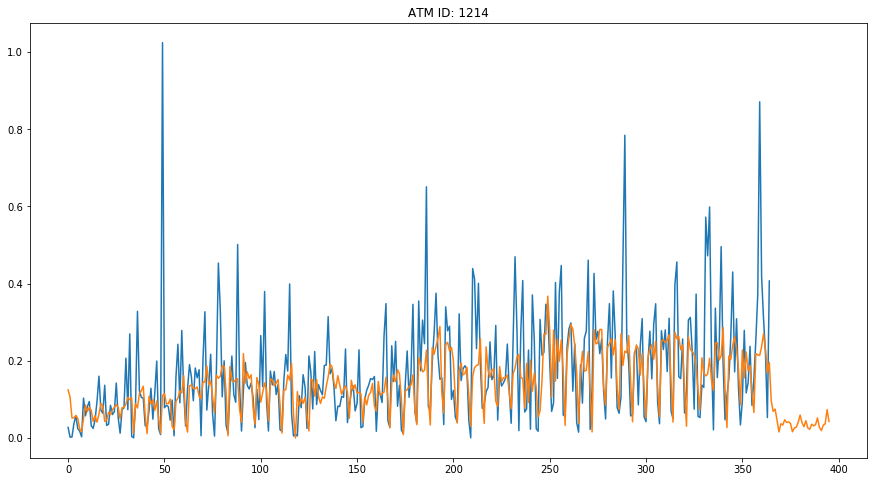

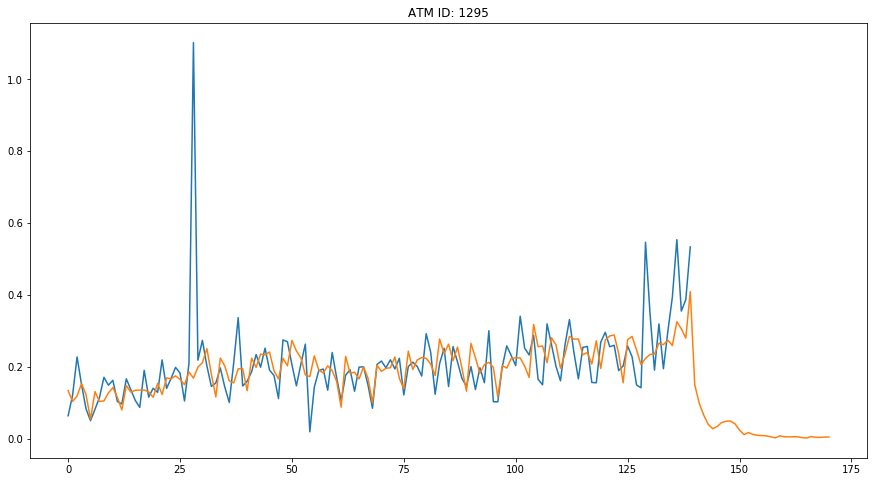

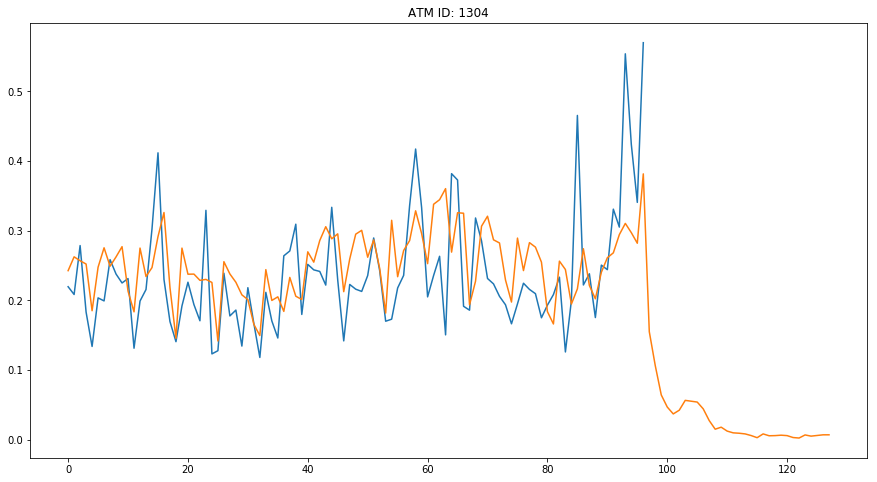

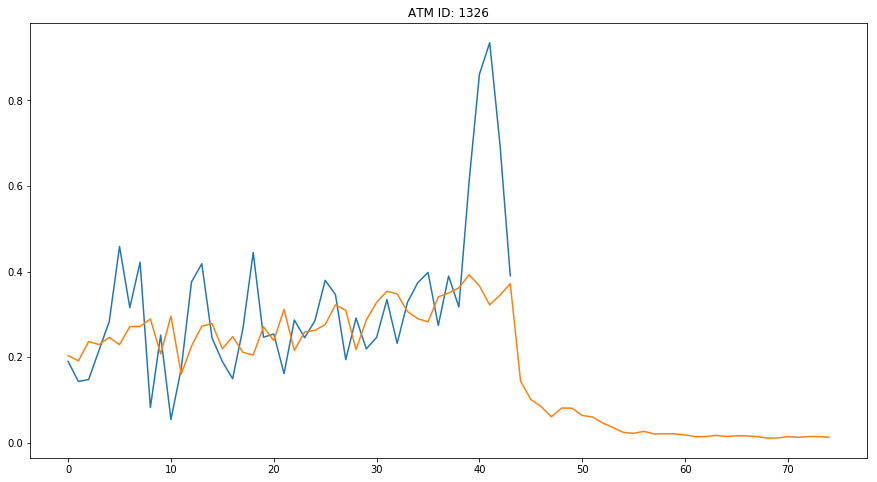

In [403]:
smoothed_predictions = {}
for _id in df.id.unique():
    _df = test_dataset_padded[test_dataset_padded.id == _id]
    preds_on_id = []
    for st_idx in range(len(_df)-14):        
        sample_input = _df.iloc[st_idx:st_idx+14, :].fillna(0.0).values
        
        # make prediction using stacked lstm model
        prediction = predict_on_sample(model, sample_input)
        
        # get amts from previous 3 years for given day&month
        prev_year_amts = get_prev_year_amts(
            dataframe=_previous_january_amts, 
            atm_id=_id, 
            date=_df.index[st_idx+14], 
            years=range(2017, 2020)
        )
        
        # smooth model prediction by averaging given and previous 3 year predictions
        prediction = weighted_average(
            values=prev_year_amts.tolist()+[prediction],
            weights=[0.8, 1.2, 1.5, 2.0]
        )
        
        # append to temporary dataframe where predictions are stored for given ATM ID
        _df.iloc[st_idx+14, -1] = prediction
        preds_on_id.append(prediction)
        
        smoothed_predictions[(str(_df.index[st_idx+14]), _id)] = prediction
    
    if random.random() < 0.05:
        plot_predictions_on_test(_id=_id, preds=np.array(preds_on_id), title=f"ATM ID: {_id}")

### Store Predictions

In [404]:
len(smoothed_predictions) == df.id.unique().shape[0]*31

True

In [405]:
_smoothed_predictions_df = pd.concat(
    [
        pd.DataFrame(list(smoothed_predictions.keys()), columns=['OPERATIONDATE', 'CASHPOINTID']), 
        pd.DataFrame(smoothed_predictions.values(), columns=['AMT_SCALED'])
    ],
    axis=1
)

In [406]:
_smoothed_predictions_df.OPERATIONDATE = pd.to_datetime(_smoothed_predictions_df.OPERATIONDATE)

In [407]:
_smoothed_predictions_df.head()

,OPERATIONDATE,CASHPOINTID,AMT_SCALED
0,2020-01-01,0,0.110367
1,2020-01-02,0,0.085139
2,2020-01-03,0,0.115651
3,2020-01-04,0,0.091182
4,2020-01-05,0,0.093370


In [408]:
_smoothed_predictions_df.to_csv('data/submisson_stacked_lstm_smoothed_predictions.csv', index=False)

## Replace predictions with zero for ATMs that have last 14 days of 2019 missing

In [409]:
_ids_for_zero_predictions = set(zero_predictions[zero_predictions == 14].index.values)

In [410]:
_smoothed_predictions_df_with_zeros = _smoothed_predictions_df.copy(deep=True)

In [411]:
_smoothed_predictions_df_with_zeros.loc[
    _smoothed_predictions_df_with_zeros.CASHPOINTID.apply(lambda x: x in _ids_for_zero_predictions), 
    "AMT_SCALED"
] = 0.0

In [412]:
_smoothed_predictions_df_with_zeros.to_csv('data/submisson_stacked_lstm_smoothed_predictions_with_zeros_on_missing_atms.csv', index=False)